### Load Predictions and convenience methods

In [1]:
import pandas as pd
import matplotlib
import warnings
import os
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import analysis_utils
from copy import deepcopy

# path to repository folder (data is stored here as well)
path = '..'
preds_loc = os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv')

# default plotting settings
font = {'size'   : 18}
matplotlib.rc('font', **font)

# notebook display options
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 300

# load dictionaries to improve formatting of model names
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

# load the predictions and split them into dataframes
db = pd.read_csv(preds_loc).set_index(['uid', 'uid2'])

### Note the mutational bias toward alanine

Text(0.5, 1.0, 'Mutation Bias')

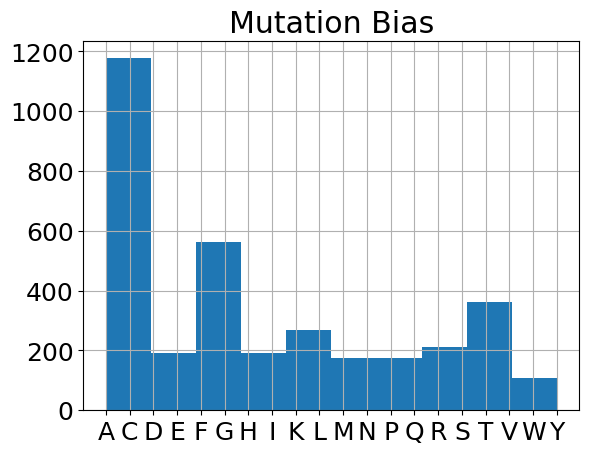

In [2]:
db.sort_values('mutation')['mutation'].hist()
plt.title('Mutation Bias')

### Preprocess and categorize data

Original unique mutations: 3421
['esmif_monomer_dir', 'msa_1_dir', 'msa_2_dir', 'msa_3_dir', 'msa_4_dir', 'msa_5_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'mutcomputex_dir', 'esm2_3B_dir', 'esm2_15B_half_dir', 'esmif_multimer_dir', 'mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'mif_dir', 'mifst_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'esm1v_1_dir', 'esm1v_2_dir', 'esm1v_3_dir', 'esm1v_4_dir', 'esm1v_5_dir', 'esm1v_median_dir', 'esm1v_mean_dir', 'ankh_dir', 'tranception_dir', 'korpm_dir', 'tranception_weights_dir', 'stability-oracle_dir', 'cartesian_ddg_dir']
['K1566_pslm_rfa_1_dir', 'K1566_pslm_rfa_2_dir', 'K1566_pslm_rfa_3_dir', 'K1566_pslm_rfa_4_dir', 'K1566_pslm_rfa_5_dir', 'K1566_pslm_rfa_6_dir', 'K1566_pslm_rfa_7_dir', 'K1566_pslm_rfa_8_dir', 'K1566_pslm_rfa_9_dir', 'K1566_pslm_rfa_10_dir', 'K1566_pslm_rfa_11_dir']
['esmif_monomer_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'mutcomputex_dir', 'esm2_3B_dir', 'esm2_15B_half_dir', 'es

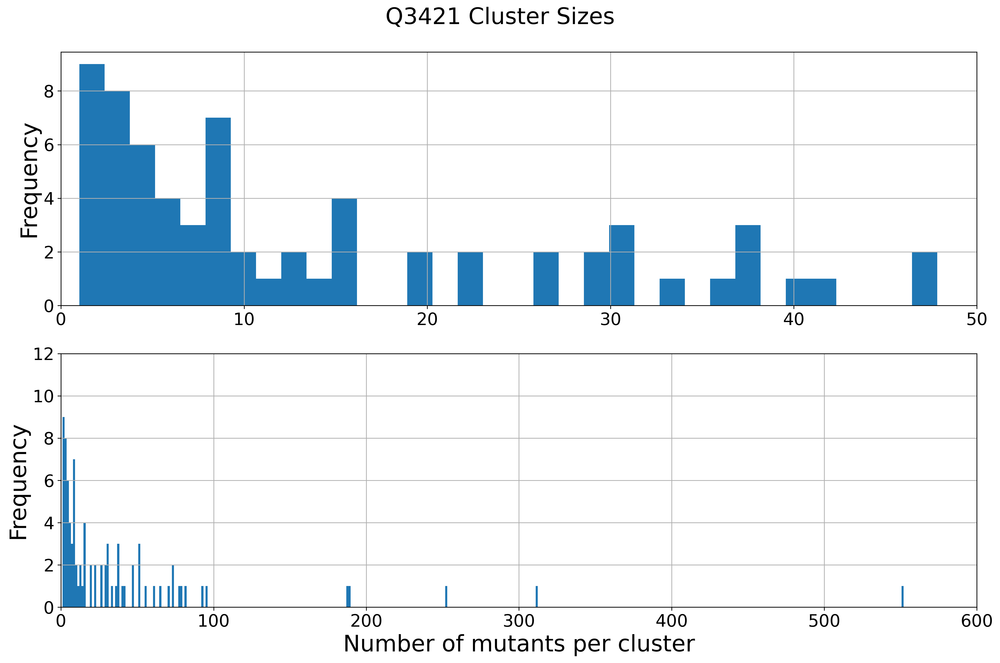

In [3]:
db_class = db

print('Original unique mutations:', len(db_class))

evolutionary = ['tranception', 'msa_transformer', 'esm1v', 'msa', 'esm2', 'ankh']
structural = ['mpnn', 'mif', 'mifst', 'esmif', 'mutcomputex', 'saprot']
supervised = ['MAESTRO', 'ThermoNet', 'INPS', 'PremPS', 'mCSM', 'DUET', 'ACDC', 'I-Mutant3.0', 'SAAFEC', 'MuPro']
untrained = ['DDGun']
potential = ['KORPM', 'PopMusic', 'SDM', 'korpm']
biophysical = ['cartesian_ddg', 'FoldX', 'Evo', 'Cartddg']
transfer = ['stability-oracle']

original_pred_cols = db_class.columns[db_class.columns.str.contains('|'.join(evolutionary + structural + supervised + untrained + potential + biophysical + transfer))]
original_pred_cols = list(original_pred_cols.drop(['reduced_msa_file', 'full_msa_file', 'tranception_dms', 'msa_weights']))#, 'msa_weights']))
original_pred_cols = [c for c in original_pred_cols if not 'runtime' in c]
original_pred_cols = [c for c in original_pred_cols if not 'cluster' in c]
original_pred_cols = [c for c in original_pred_cols if not 'overlaps' in c]
original_pred_cols = [c for c in original_pred_cols if not 'pll' in c]
print(original_pred_cols)

ensemble_cols = [c for c in db_class.columns if 'pslm' in c]
print(ensemble_cols)

db_runtimes = db[[c for c in db.columns if 'runtime' in c]]

original_pred_cols_reduced = deepcopy(original_pred_cols)
for col in [f'esm1v_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
for col in [f'msa_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)

print(original_pred_cols_reduced)

db_class = db_class[original_pred_cols + ensemble_cols + ['ddG', 'cluster']]

#db_class_rescaled = db_class.copy(deep=True)
#db_class_rescaled[original_pred_cols] /= db_class_rescaled[original_pred_cols].std()

db_class['mpnn_rosetta_dir'] = db_class['cartesian_ddg_dir'] + db_class['mpnn_20_00_dir']
db_class['random_dir'] = np.random.normal(loc=db['ddG'].mean(), size=len(db_class))
#db_class['korpm_dir'] = db_class['KORPMD_dir']
db_class['ddG_dir'] = db_class['ddG']
db_class['upper_bound_dir'] = db_class['ddG'] + np.random.normal(loc=0, size=len(db_class))

#db_class = db_class.drop([c+'_dir' for c in ['ACDCNND', 'FoldXD', 'DDGunD', 'CartddgD']], axis=1) #'PopMsD', 'TNetD'

print(f'Detected {len(db_class.loc[db["on_interface_dir"].astype(bool)])} interface mutations')

fig, axes = plt.subplots(2, figsize=(15, 10), dpi=300) 

db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[0])
axes[0].set_xlim([0, 50]) 
axes[0].tick_params(axis='x', labelsize=18) 
axes[0].set_ylabel('Frequency', fontsize=24)  

# Second plot
db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[1])
axes[1].set_xlim([0, 600]) 
axes[1].set_ylim([0, 12])  
axes[1].set_xlabel('Number of mutants per cluster', fontsize=24) 
axes[1].set_ylabel('Frequency', fontsize=24)
axes[1].tick_params(axis='x', labelsize=18)

plt.suptitle('Q3421 Cluster Sizes', fontsize=24)
plt.tight_layout()

db_class

fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'supp_fig7.svg'), bbox_inches='tight')

In [4]:
# Clusters with >= or < 50 unique mutants
print((db_class.groupby('cluster').count().iloc[:, 0] >= 50).sum(), (db_class.groupby('cluster').count().iloc[:, 0] < 50).sum())

19 67


### Non-bootstrapped Analysis of Q3421 (not in text; has the benefit of including all data at once)

In [5]:
# TABLE 1
# Note: due to changes in the dependencies and small changes to preprocessing,
# results have changed very slightly from the current revision, but do not affect
# the interpretation of results or conclusions

# could replace stats=() with ('n', 'MCC', 'auprc', 'ndcg', 'spearman')
# but then you would not be saving the other stats. 
# uncomment to_csv lines to save to a custom location
#db_class['code'] = db_class.index.str[:4]
summ = analysis_utils.compute_stats(db_class[original_pred_cols_reduced + ensemble_cols + ['cluster', 'ddG', 'mpnn_rosetta_dir', 'upper_bound_dir']], 
                                    stats=('n', 'MCC', 'pred_positives', 'tp', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'tp', 'recall@k1.0', 'aumsc', 'auppc'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=0)
rcv = summ.copy(deep=True)
summ.to_csv('../data/extended/q3421_extended.csv')
tmp1 = summ #.loc[:,['n', 'MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = tmp1.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'n', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ', 'mean_t1s', 'Net Stabilization', 'pred_positives', 
 'mean_stabilization', 'True Positives', 'Sensitivity', 'MRR', 'recall@k1.0']]#, 'Accuracy']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta CartDDG', 'ProteinMPNN mean', 'ProteinMPNN 0.3', 'ProteinMPNN 0.2', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'Ankh', 
    'ESM-2 3B', 'ESM-2 15B', 'Structural', 'Evolutionary', 'Supervised', 'ESM-2 150M', 'ESM-2 650M', 'Ensemble', 'ESM-2 mean', 'ESM-IF mean', 
    'MIF_mean', 'Clustered Ensemble', 'Ensemble_2', 'ProteinMPNN 0.1', 'MIF-ST', 'KORPM', 'MSA-T mean', 'MSA-T 1', 'Tranception', 'Tranception reweighted', 'ESM-1V mean', 
    'ESM-1V 2', 'Gaussian noise', 'ΔΔG label', 'ΔTm label', 'Rosetta/ProtMPNN', 'Stability Oracle', 'MutComputeX', 
    'Ensemble 4 Feats', 'Ensemble 5 Feats', 'Ensemble 6 Feats', 'Ensemble 7 Feats', 'Ensemble 8 Feats', 'ΔΔG label', 'Theoretical Max'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp

# < 4 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

n    MCC  AUPRC      ρ  wNDCG  \
measurement model_type  model                                                  
ΔΔG         unknown     Theoretical Max   3421.0  0.541  0.727  0.831  0.841   
            ensemble    Ensemble 7 Feats  3421.0  0.306  0.480  0.596  0.679   
                        Ensemble 8 Feats  3421.0  0.307  0.485  0.600  0.682   
                        Ensemble 6 Feats  3421.0  0.307  0.481  0.596  0.674   
            struc. PSLM Rosetta/ProtMPNN  3421.0  0.344  0.530  0.620  0.706   
            ensemble    Ensemble 5 Feats  3421.0  0.305  0.481  0.596  0.677   
            transfer    Stability Oracle  3408.0  0.355  0.503  0.595  0.700   
            ensemble    Ensemble 4 Feats  3421.0  0.316  0.484  0.575  0.680   
            biophysical Rosetta CartDDG   3421.0  0.330  0.473  0.563  0.673   
            struc. PSLM MIF               3421.0  0.266  0.437  0.480  0.660   
                        ESM-IF            3421.0  0.241  0.430  0.452  0.658   
                        ProteinMPNN 0.3   3421.0  0.286  0.454  0.479  0.686   
                        ProteinMPNN 0.2   3421.0  0.288  0.460  0.488  0.679   
                        ProteinMPNN 0.1   3421.0  0.298  0.461  0.480  0.687   
                        ESM-IF(M)         3421.0  0.228  0.414  0.426  0.645   
            potential   KORPM             3421.0  0.257  0.400  0.471  0.659   
            struc. PSLM MIF-ST            3421.0  0.216  0.381  0.402  0.619   
                        MutComputeX       3409.0  0.214  0.402  0.365  0.635   
            seq. PSLM   ESM-2 650M        3421.0  0.198  0.362  0.291  0.612   
                        Ankh              3421.0  0.171  0.344  0.317  0.610   
                        ESM-2 3B          3421.0  0.174  0.329  0.260  0.597   
                        ESM-2 15B         3421.0  0.166  0.328  0.257  0.600   
                        MSA-T mean        3421.0  0.159  0.340  0.282  0.592   
                        ESM-2 150M        3421.0  0.150  0.338  0.219  0.610   
                        ESM-1V mean       3421.0  0.150  0.336  0.218  0.591   
                        Tranception       3421.0  0.159  0.330  0.266  0.571   

                                          wAUPRC     wρ  mean_t1s  \
measurement model_type  model                                       
ΔΔG         unknown     Theoretical Max    0.713  0.726     1.583   
            ensemble    Ensemble 7 Feats   0.572  0.500     0.626   
                        Ensemble 8 Feats   0.575  0.498     0.707   
                        Ensemble 6 Feats   0.572  0.496     0.494   
            struc. PSLM Rosetta/ProtMPNN   0.572  0.496     0.702   
            ensemble    Ensemble 5 Feats   0.575  0.495     0.524   
            transfer    Stability Oracle   0.547  0.481     0.427   
            ensemble    Ensemble 4 Feats   0.575  0.480     0.552   
            biophysical Rosetta CartDDG    0.537  0.434     0.446   
            struc. PSLM MIF                0.526  0.406     0.547   
                        ESM-IF             0.512  0.406     0.722   
                        ProteinMPNN 0.3    0.527  0.403     0.585   
                        ProteinMPNN 0.2    0.541  0.400     0.425   
                        ProteinMPNN 0.1    0.545  0.394     0.493   
                        ESM-IF(M)          0.503  0.382     0.617   
            potential   KORPM              0.518  0.358     0.282   
            struc. PSLM MIF-ST             0.487  0.329     0.181   
                        MutComputeX        0.481  0.283     0.111   
            seq. PSLM   ESM-2 650M         0.461  0.281     0.082   
                        Ankh               0.481  0.267    -0.017   
                        ESM-2 3B           0.450  0.258    -0.051   
                        ESM-2 15B          0.450  0.243     0.021   
                        MSA-T mean         0.470  0.240    -0.068   
                        ESM-2 150M         0.450  0.231     0.092   
            

### Simultaneously Generate Figure 1A and ED Table 1

In [6]:
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'recall@k0.0', 'recall@k1.0'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=100, quiet=True)
tmp1 = summ.reset_index()
tmp1.to_csv('../data/extended/q3421_extended_bootstrapped.csv')

s2 = tmp1.sort_values('auprc_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'upper_bound_dir',
            'K1566_pslm_rfa_2_dir', 
            'K1566_pslm_rfa_3_dir', 
            'K1566_pslm_rfa_4_dir',
            'K1566_pslm_rfa_5_dir',
            'K1566_pslm_rfa_6_dir',
            'K1566_pslm_rfa_7_dir',
            'K1566_pslm_rfa_8_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)

# ~ 15 minutes for 100 bootstraps

upper_bound
mpnn_rosetta
stability-oracle
cartesian_ddg
mpnn_20_00
korpm
esm2_650M
random


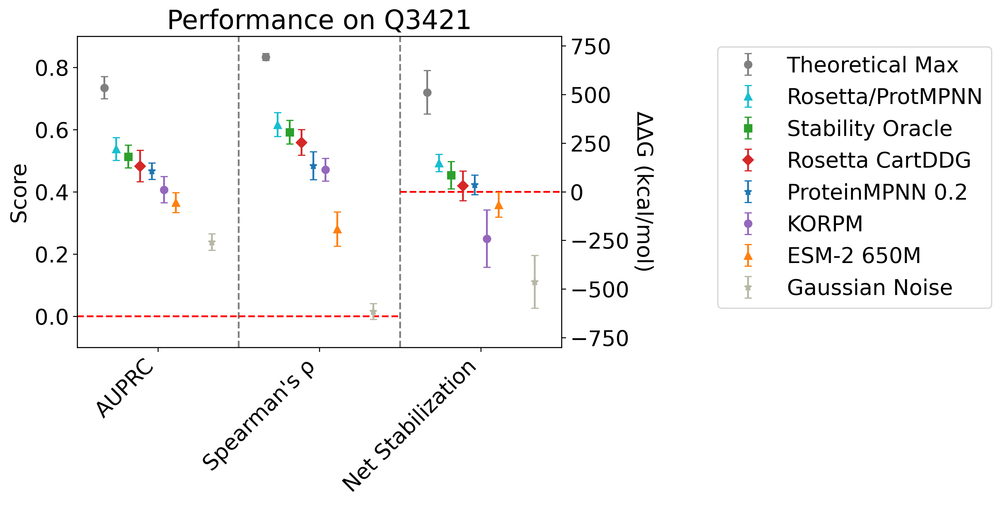

In [7]:
import importlib
importlib.reload(analysis_utils)

plot_cols = ['auprc', 'spearman','net_stabilization']
plot_models = ['upper_bound', 'mpnn_rosetta', 'stability-oracle', 'cartesian_ddg', 'mpnn_20_00', 'korpm', 'esm2_650M', 'DDGun3D', 'INPS3D', 'random']
plot_title = 'Q3421'
y_lim = (-0.1, 0.9)
right_y_lim = (-800, 800)
table_cols = ['auprc', 'spearman','net_stabilization', 'MCC', 'sensitivity', 'recall@k1.0']
tab, fig = analysis_utils.bootstrap_table(s3, 
                plot_cols,
                plot_models, 
                plot_title,
                y_lim,
                right_y_lim,
                table_cols, 
                var_cols=['net_stabilization'], #table_cols, 
                sort_col='auprc',
                saveloc_formatted='../data/extended/q3421_bootstrapped_formatted.csv',
                saveloc_full='../data/extended/figure_data/fig1a.csv')

fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'fig1a.svg'), bbox_inches='tight')

### Recovery Curves (Visualization of Stable Mutant Enrichment, Figure 2. Only "b)" is used in main text)

In [52]:
db_class_r = db_class.copy(deep=True)
db_class_r['random_2_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_3_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_4_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_5_dir'] = np.random.normal(loc=0, size=len(db_class_r))

db_class_r['upper_bound_2_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))
db_class_r['upper_bound_3_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))
db_class_r['upper_bound_4_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))
db_class_r['upper_bound_5_dir'] = db_class_r['ddG'] + np.random.normal(loc=0, size=len(db_class_r))

class_result_new = analysis_utils.compute_stats(db_class_r, stats=('aumsc', 'auppc'), measurements=['ddG'], grouper='cluster', n_bootstraps=0)
crn = class_result_new.reset_index()
crn.loc[crn['model'].str.contains('random'), 'model'] = 'random_dir'
crn.loc[crn['model'].str.contains('upper_bound'), 'model'] = 'upper_bound_dir'
crn = crn.set_index(['measurement', 'model_type', 'model'])

crn_out = crn[[c for c in crn.columns if '$' in c]]
crn_out = crn_out.reset_index()
crn_out['model'] = crn_out['model'].apply(lambda x: analysis_utils.remap_names_2.get(x))
crn_out = crn_out.dropna(subset='model').drop(['measurement'], axis=1)
crn_out = crn_out.set_index(['model_type', 'model'])
crn_out.to_csv(os.path.join(path, 'data', 'extended', 'figure_data', 'fig2a.csv'), encoding='utf-8-sig')
# < 4 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

In [53]:
crn_out = crn[[c for c in crn.columns if '$' in c]]
crn_out = crn_out.reset_index()
crn_out['model'] = crn_out['model'].apply(lambda x: analysis_utils.remap_names_2.get(x))
crn_out = crn_out.dropna(subset='model').drop(['measurement'], axis=1)
crn_out = crn_out.set_index(['model_type', 'model'])
crn_out.to_csv(os.path.join(path, 'data', 'extended', 'figure_data', 'fig2a.csv'), encoding='utf-8-sig')

cartesian_ddg_dir
esm2_650M_dir
korpm_dir
upper_bound_dir
mpnn_20_00_dir
mpnn_rosetta_dir
stability-oracle_dir
random_dir
cartesian_ddg_dir
esm2_650M_dir
korpm_dir
upper_bound_dir
mpnn_20_00_dir
mpnn_rosetta_dir
stability-oracle_dir
random_dir


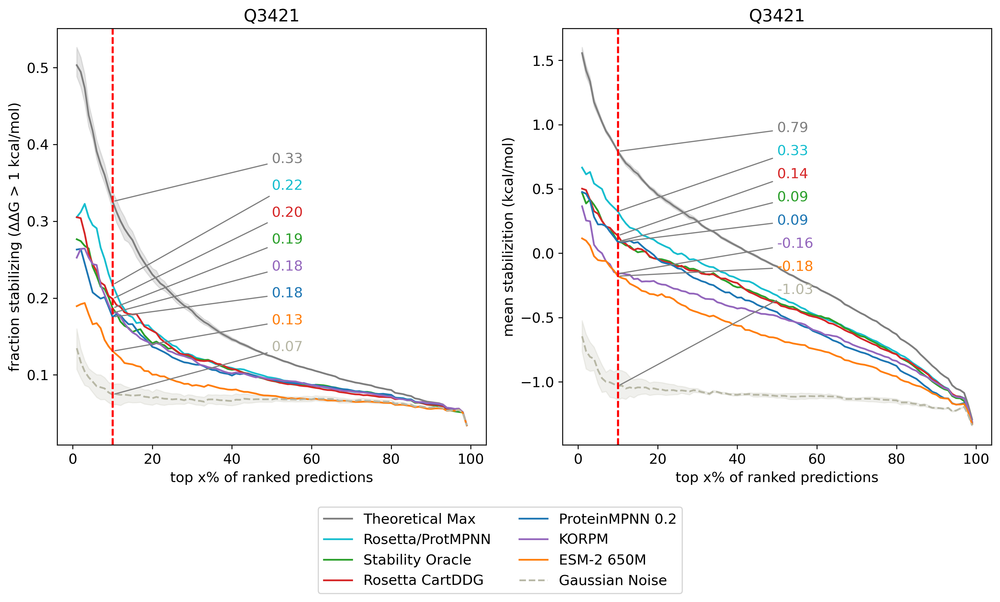

In [54]:
fig = analysis_utils.recovery_curves(crn, ['upper_bound_dir', 'mpnn_rosetta_dir', 'stability-oracle_dir', 'cartesian_ddg_dir', 'mpnn_20_00_dir', 'korpm_dir', 'esm2_650M_dir',  'random_dir'], left_spacing=0.07, left_text_offset=(40, 0.05), right_spacing=0.06, right_text_offset=(40, 0.15), measurements=['ddG'], plots=['auppc', 'aumsc'], title='Q3421') #'q3421_pslm_rfa_5_dir', 
fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'fig2a.svg'), bbox_inches='tight')

### Recovery Curves (Visualization of Stable Mutant Enrichment, Supplementary Figure 6)

ankh_dir
esm2_650M_dir
upper_bound_dir
mutcomputex_dir
mpnn_20_00_dir
mif_dir
esmif_multimer_dir
tranception_weights_dir
msa_transformer_mean_dir
random_dir
ankh_dir
esm2_650M_dir
upper_bound_dir
mutcomputex_dir
mpnn_20_00_dir
mif_dir
esmif_multimer_dir
tranception_weights_dir
msa_transformer_mean_dir
random_dir


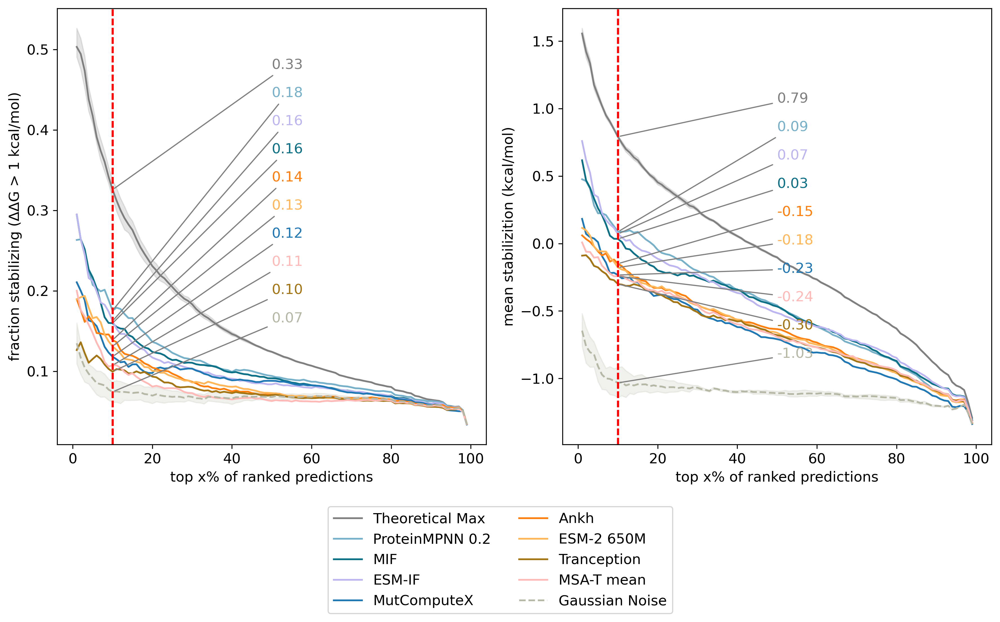

In [55]:
fig = analysis_utils.recovery_curves(crn, ['upper_bound_dir', 'mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_dir', 'mutcomputex_dir', 'ankh_dir', 'esm2_650M_dir', 'tranception_weights_dir', 'msa_transformer_mean_dir', 'random_dir'], left_spacing=0.07, left_text_offset=(40, 0.15), right_spacing=0.07, right_text_offset=(40, 0.25), measurements=['ddG'], plots=['auppc', 'aumsc'], title='')
fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'supp_fig5.png'), bbox_inches='tight')

### Bootstrapped Q3421 Analysis (Used for Figure 1 and Extended Data Table 1)

### Supplementary Table 5

In [67]:
summ2 = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'ndcg', 'accuracy', 'mse', 'net_stabilization', 'mean_stabilization', 'precision', 'recall'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=100, quiet=True)
tmp2 = summ2.reset_index()

# < 15 minutes for 100 bootstraps

upper_bound
stability-oracle
korpm
random
mpnn_20_00
cartesian_ddg
esm2_650M
mpnn_rosetta


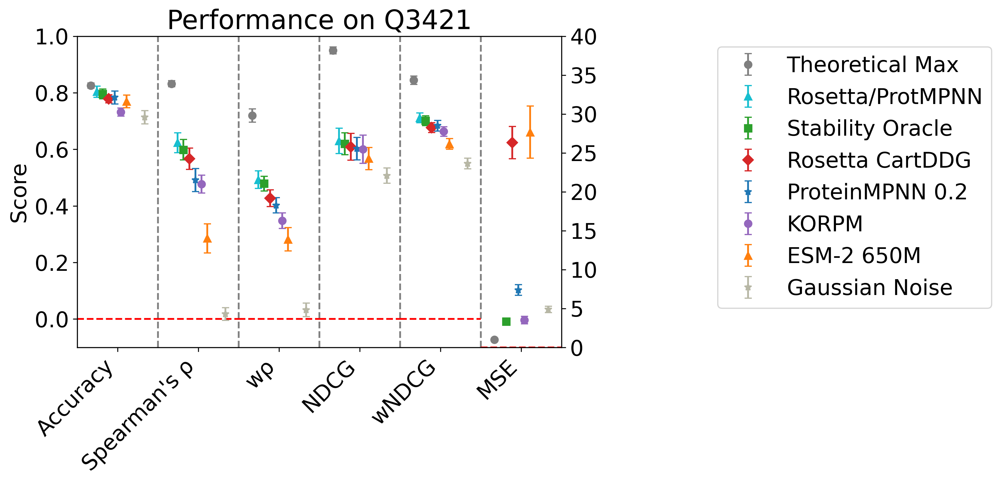

In [69]:
ss2 = tmp2.sort_values('mean_squared_error_mean', ascending=False).dropna(how='all', axis=1).reset_index()
ss3 = ss2.loc[ss2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir',
            'upper_bound_dir', 
            'K1566_pslm_rfa_2_dir', 
            'K1566_pslm_rfa_3_dir', 
            'K1566_pslm_rfa_4_dir',
            'K1566_pslm_rfa_5_dir',
            'K1566_pslm_rfa_6_dir',
            'K1566_pslm_rfa_7_dir',
            'K1566_pslm_rfa_7_dir',
            'K1566_pslm_rfa_8_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)
plot_cols = ['accuracy', 'spearman', 'weighted_spearman', 'ndcg', 'weighted_ndcg', 'mean_squared_error',]
plot_models = ['upper_bound', 'mpnn_rosetta', 'stability-oracle', 'cartesian_ddg', 'mpnn_20_00', 'korpm', 'esm2_650M', 'DDGun3D', 'INPS3D', 'random']
plot_title = 'Q3421'
y_lim = (-0.1, 1)
right_y_lim = (0, 40)
table_cols = ['mean_squared_error', 'accuracy', 'spearman', 'weighted_spearman', 'ndcg', 'weighted_ndcg']
tab, fig = analysis_utils.bootstrap_table(ss3, 
                plot_cols,
                plot_models, 
                plot_title,
                y_lim,
                right_y_lim,
                table_cols, 
                var_cols=['mean_squared_error'],
                sort_col='mean_squared_error',
                sort_order='ascending',
                saveloc_formatted='../data/extended/q3421_bootstrapped_formatted_extra.csv'
                )

### Extended Data Figure 1 describing correlation between predictions and scores of two selected models

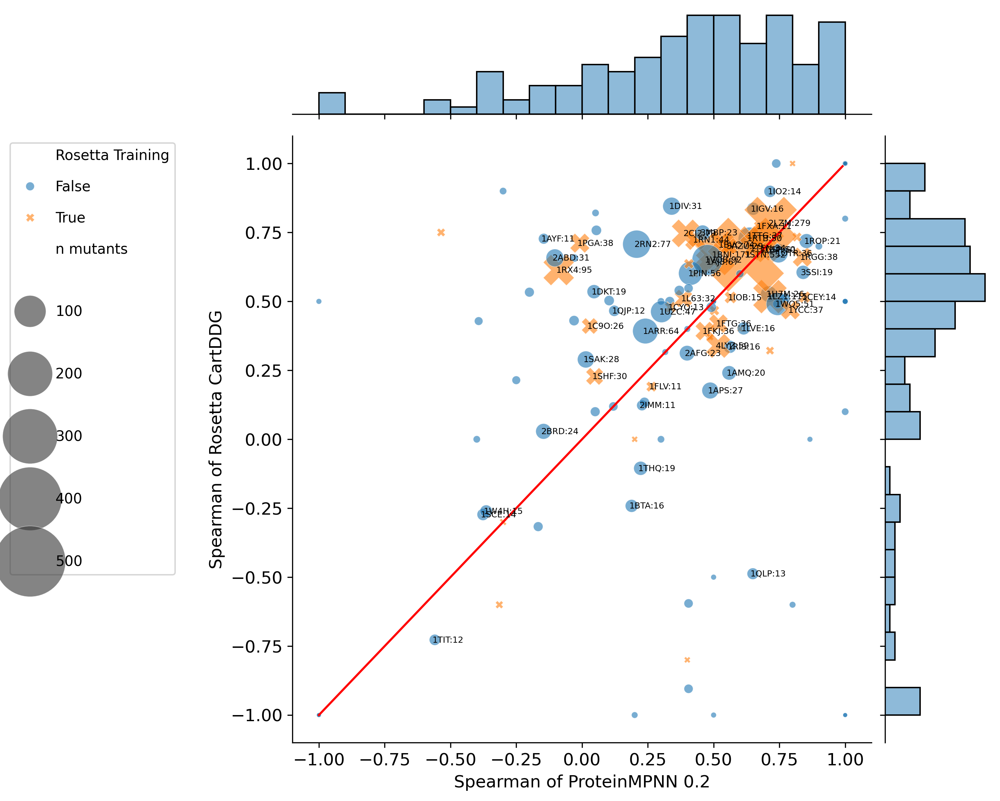

In [66]:
import importlib
importlib.reload(analysis_utils)

col = 'Rosetta Training'
db_class_2 = db_class.copy(deep=True)
#db_class_2 = db_class_2.join(db_new[['tranception_new_dir']])
db_class_2['ddG_dir'] = db_class_2['ddG']
db_class_2[col] = db['overlaps_seq_rosetta']
db_class_2['code'] = db_class_2.reset_index('uid2').index.str[:4]
_, g = analysis_utils.correlations(db_class_2, None, stat='spearman', marker_name=col,
    score_name='cartesian_ddg_dir', score_name_2='mpnn_20_00_dir', min_obs=10, group=True, plot=True, out=True, runtime=False,
    saveloc_comp=os.path.join(path, 'data', 'extended', 'figure_data', 'ed_fig1.csv'))
g.fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'ed_fig1.svg'), bbox_inches='tight')
g.fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'ed_fig1.pdf'), bbox_inches='tight')

mpnn_30_00_dir
mpnn_20_00_dir
mpnn_10_00_dir
esm2_150M_dir
esm2_650M_dir
esm2_3B_dir
esm2_15B_half_dir
ddG_dir


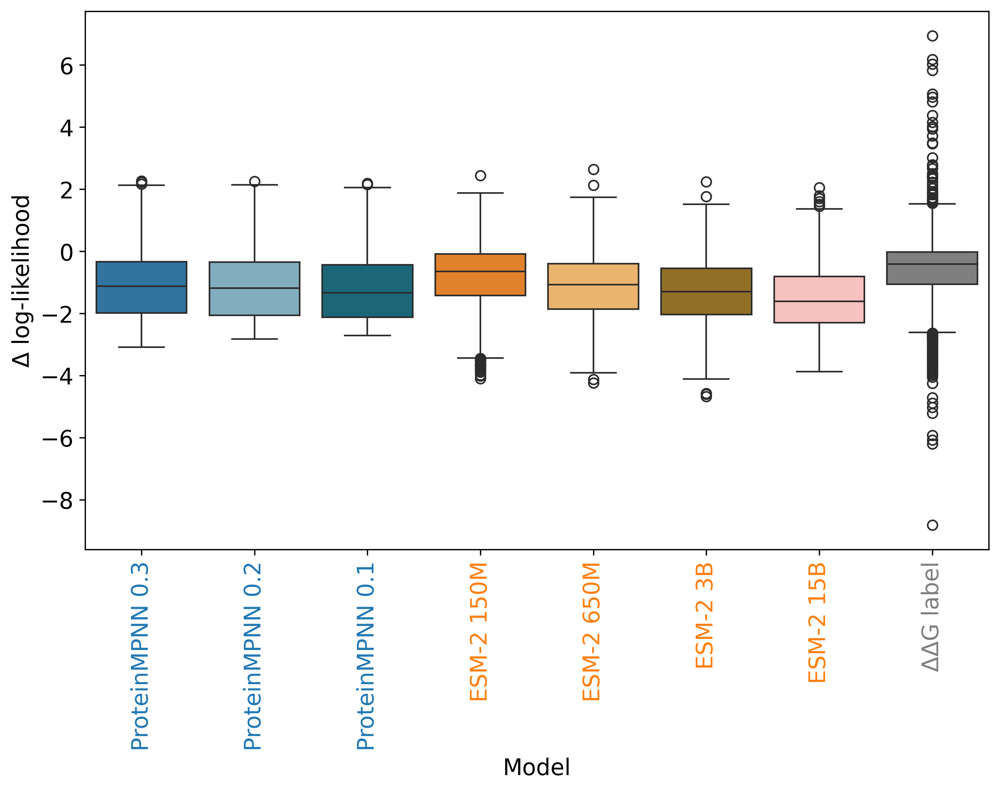

In [15]:
dbc2 = db_class[['mpnn_30_00_dir', 'mpnn_20_00_dir', 'mpnn_10_00_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'esm2_3B_dir', 'esm2_15B_half_dir', 'ddG_dir']]
dbc2 /= dbc2.std()
cols = dbc2.columns
db_cols = pd.DataFrame(data=cols)
cmap = analysis_utils.get_color_mapping(db_cols, 0)
fig = plt.figure(figsize=(8, 4), dpi=300)

dbc2_out = dbc2.copy(deep=True).reset_index('uid2', drop=True)
dbc2_out.columns = [analysis_utils.remap_names_2.get(c) for c in dbc2_out.columns]
dbc2_out.to_csv(os.path.join(path, 'data', 'extended', 'figure_data', 'ed_fig2.csv'), encoding='utf-8-sig')

ax = sns.boxplot(dbc2, palette=cmap)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_ylabel('Δ log-likelihood')
ax.set_xlabel('Model')
for tick_label in ax.get_xticklabels():
    tick_label.set_color(analysis_utils.determine_base_color(tick_label))
_ = ax.set_xticklabels([remap_names_2.get(str(a).split('\'')[1],str(a).split('\'')[1]) for a in ax.get_xticklabels()])

fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'ed_fig2.svg'), bbox_inches='tight')

### Figure 4 a&b

In [16]:
subset = ['K1566_pslm_rfa_6_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'upper_bound_dir',
            'msa_transformer_mean_dir',
            'tranception_weights_dir',
            'esm2_650M_dir',
            #'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            'mpnn_rosetta_dir',
            #'mpnn_10_00_dir',
            'mpnn_20_00_dir',
            #'mpnn_30_00_dir',
            #'mif_dir',
            'mifst_dir',
            'mutcomputex_dir',
            'stability-oracle_dir',
            'random_dir',
            'ddG_dir']

  0%|          | 0/1000 [00:00<?, ?it/s]

['ΔΔG <= -1.5', '0 >= ΔΔG > -1.5', 'ΔΔG > 0']
class
0 >= ΔΔG > -1.5    906
ΔΔG <= -1.5        769
ΔΔG > 0            478
Name: n, dtype: int64


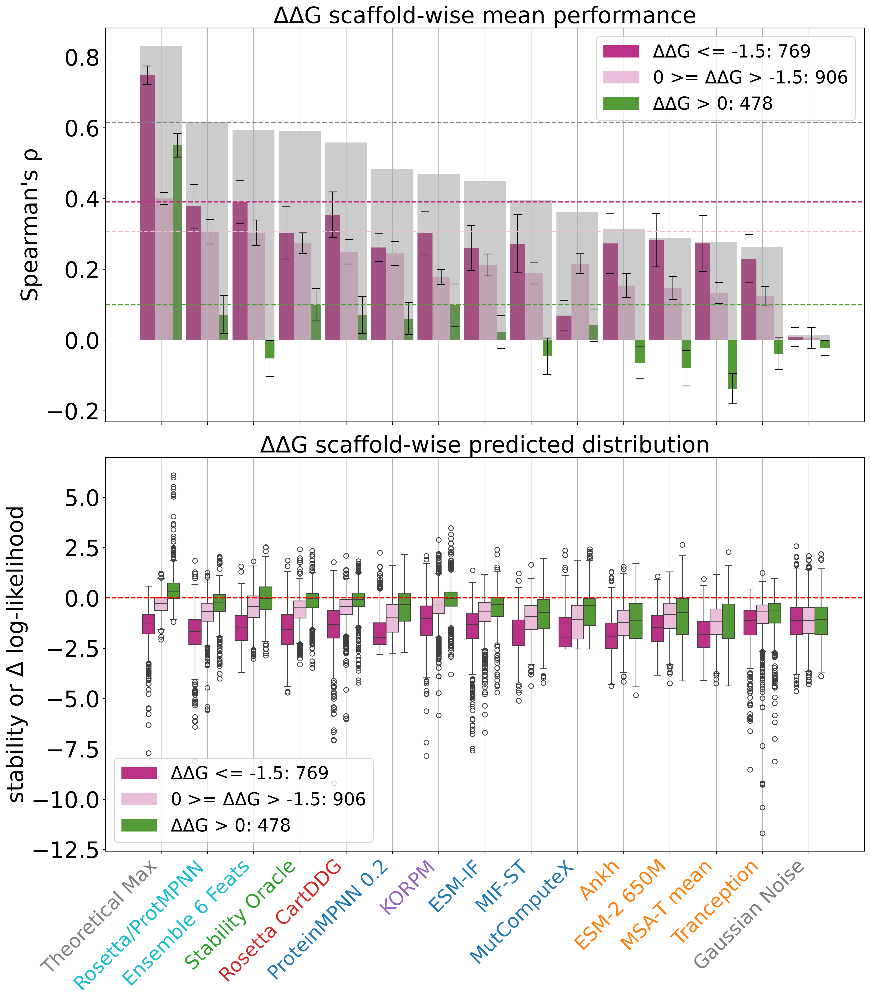

14             upper_bound_dir
10            mpnn_rosetta_dir
1         K1566_pslm_rfa_6_dir
12        stability-oracle_dir
0            cartesian_ddg_dir
9               mpnn_20_00_dir
2                    korpm_dir
7           esmif_multimer_dir
8                    mifst_dir
11             mutcomputex_dir
3                     ankh_dir
4                esm2_650M_dir
5     msa_transformer_mean_dir
6      tranception_weights_dir
13                  random_dir
Name: model, dtype: object

In [56]:
db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
# fillna only applies to a handful of predictions from Stability Oracle
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']].fillna(0)
d, model_order, fig = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset = subset,
                        grouper = 'cluster',
                        plots = 'both',
                        drop_label = True,
                        legend_loc = 'upper right',
                        saveloc_perf = os.path.join(path, 'data', 'extended', 'figure_data', 'ed_fig5a.csv')
                        )

fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'ed_fig5a.svg'), bbox_inches='tight')

model_order
# < 10 seconds

(0.0, 50.0)

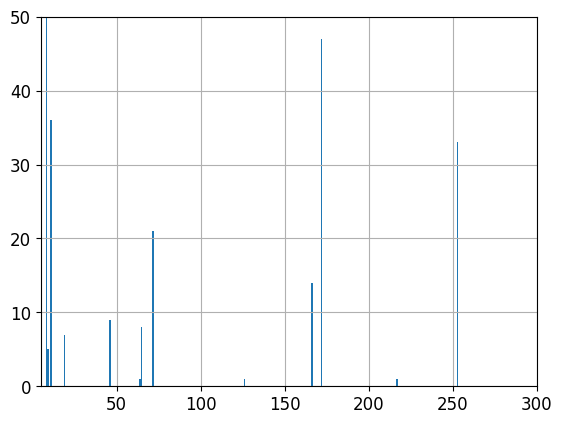

In [57]:
db_complete.loc[db_complete['neff'] < 1000, 'neff'].hist(bins=1000)
plt.xlim(5,300)
plt.ylim(0,50)

### Figure 4 c&d

  0%|          | 0/1000 [00:00<?, ?it/s]

['neff <= 300 & conservation <= 70', 'neff > 300 & conservation <= 70', 'conservation > 70']
neff <= 300 & conservation <= 70% : 185
neff > 300 & conservation <= 70% : 1590
conservation > 70% : 394
class
conservation > 70                    394
neff <= 300 & conservation <= 70     185
neff > 300 & conservation <= 70     1590
Name: n, dtype: int64


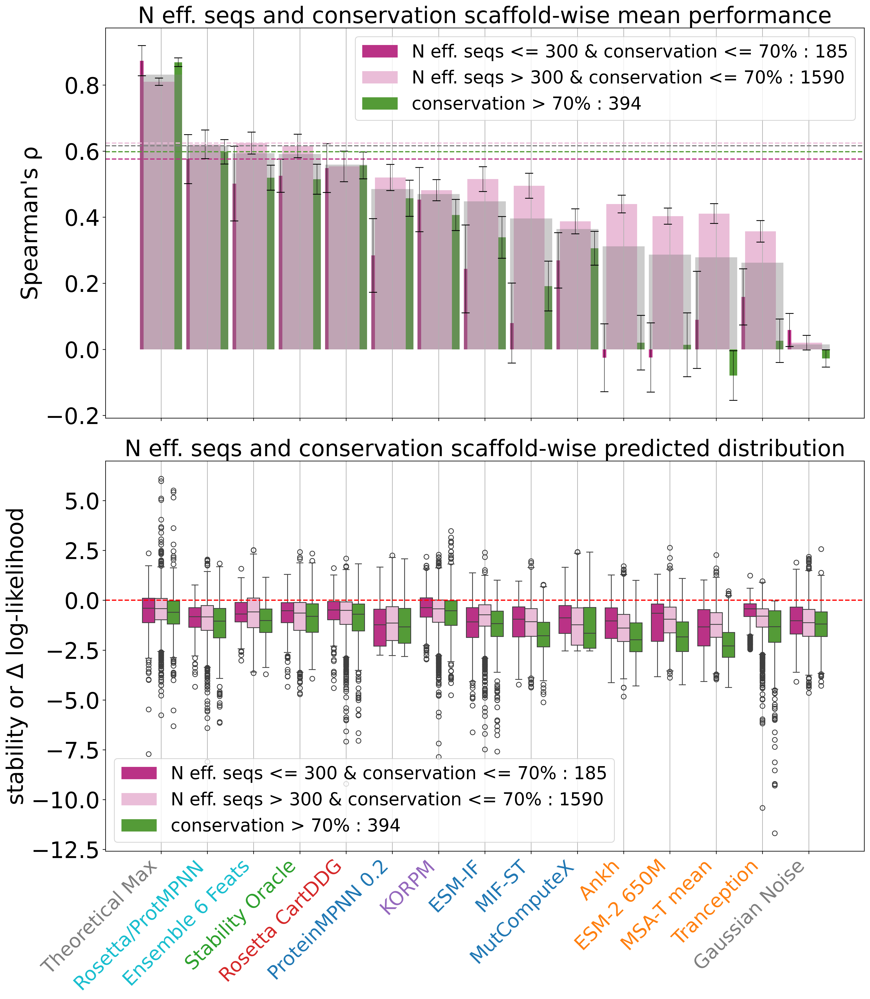

In [58]:
current_feats = ['conservation', 'neff', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d, models, fig = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'neff', 
                        split_col_2 = 'conservation', 
                        threshold_1 = 300,
                        threshold_2 = 70, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        #order=model_order,
                        plots='both',
                        drop_label = True,
                        split_last = False,
                        legend_loc = 'upper right',
                        saveloc_perf = os.path.join(path, 'data', 'extended', 'figure_data', 'ed_fig5b.csv')
                        # scaffold order is col1 & col2 > T, col1 < T & col2 > T, col1 > T and col2 < T, col1 & col2 < T
                        )

fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'ed_fig5b.svg'), bbox_inches='tight')

  0%|          | 0/1000 [00:00<?, ?it/s]

['neff <= 300 & conservation <= 70', 'neff > 300 & conservation <= 70', 'conservation > 70']
neff <= 300 & conservation <= 70: 189
neff <= 300 & conservation <= 70: 290
neff > 300 & conservation <= 70: 1586
neff > 300 & conservation <= 70: 2510
conservation > 70: 392
conservation > 70: 621
class
conservation > 70                    392
neff <= 300 & conservation <= 70     189
neff > 300 & conservation <= 70     1586
Name: n, dtype: int64


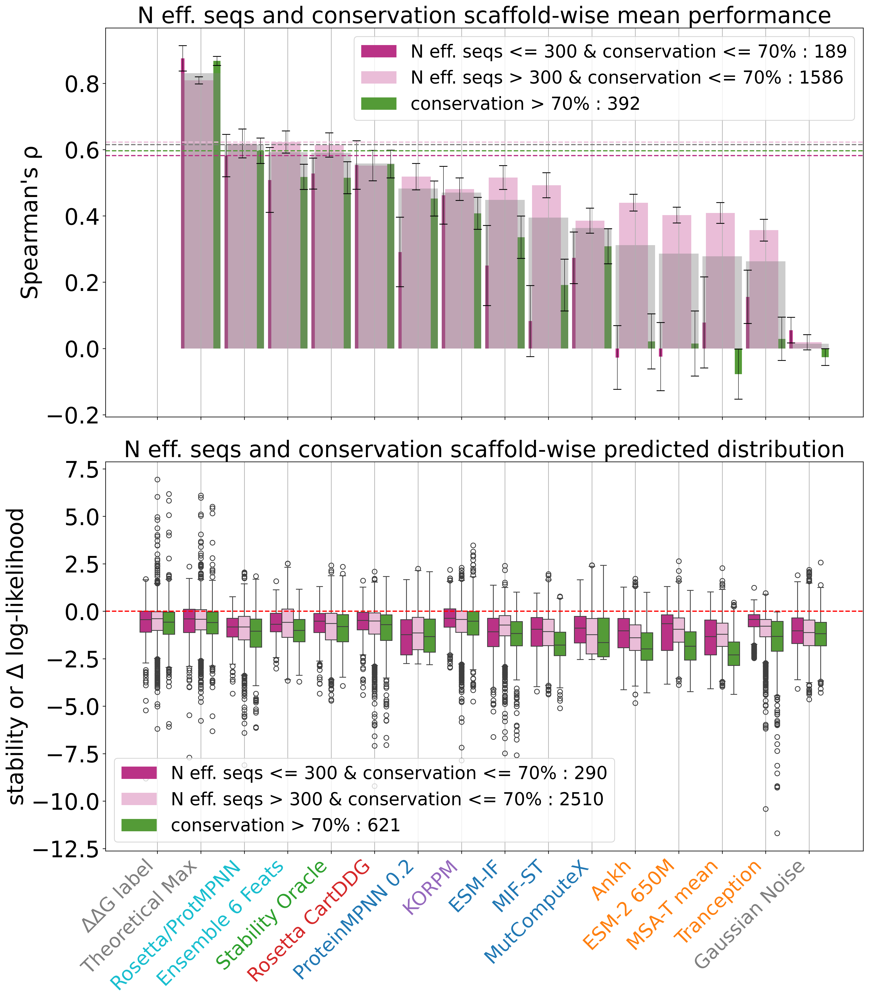

In [77]:
 current_feats = ['conservation', 'neff', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d, models, fig = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'neff', 
                        split_col_2 = 'conservation', 
                        threshold_1 = 300,
                        threshold_2 = 70, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 1000,
                        #count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        #order=model_order,
                        plots='both',
                        #drop_label = True,
                        split_last = False,
                        legend_loc = 'upper right',
                        saveloc_dist = os.path.join(path, 'data', 'extended', 'figure_data', 'ed_fig6a.csv')
                        # scaffold order is col1 & col2 > T, col1 < T & col2 > T, col1 > T and col2 < T, col1 & col2 < T
                        )
fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'ed_fig6a.svg'), bbox_inches='tight')

  0%|          | 0/1000 [00:00<?, ?it/s]

532.5
540.0
['rel_ASA <= 0.2 & delta_kdh <= 0', 'rel_ASA <= 0.2 & delta_kdh > 0', 'rel_ASA > 0.2 & delta_kdh <= 0', 'rel_ASA > 0.2 & delta_kdh > 0']
rel_ASA <= 0.2 & delta_kdh <= 0: 581
rel_ASA <= 0.2 & delta_kdh <= 0: 936
rel_ASA <= 0.2 & delta_kdh > 0: 426
rel_ASA <= 0.2 & delta_kdh > 0: 688
rel_ASA > 0.2 & delta_kdh <= 0: 430
rel_ASA > 0.2 & delta_kdh <= 0: 688
rel_ASA > 0.2 & delta_kdh > 0: 693
rel_ASA > 0.2 & delta_kdh > 0: 1109
class
rel_ASA <= 0.2 & delta_kdh <= 0    581
rel_ASA <= 0.2 & delta_kdh > 0     426
rel_ASA > 0.2 & delta_kdh <= 0     430
rel_ASA > 0.2 & delta_kdh > 0      693
Name: n, dtype: int64


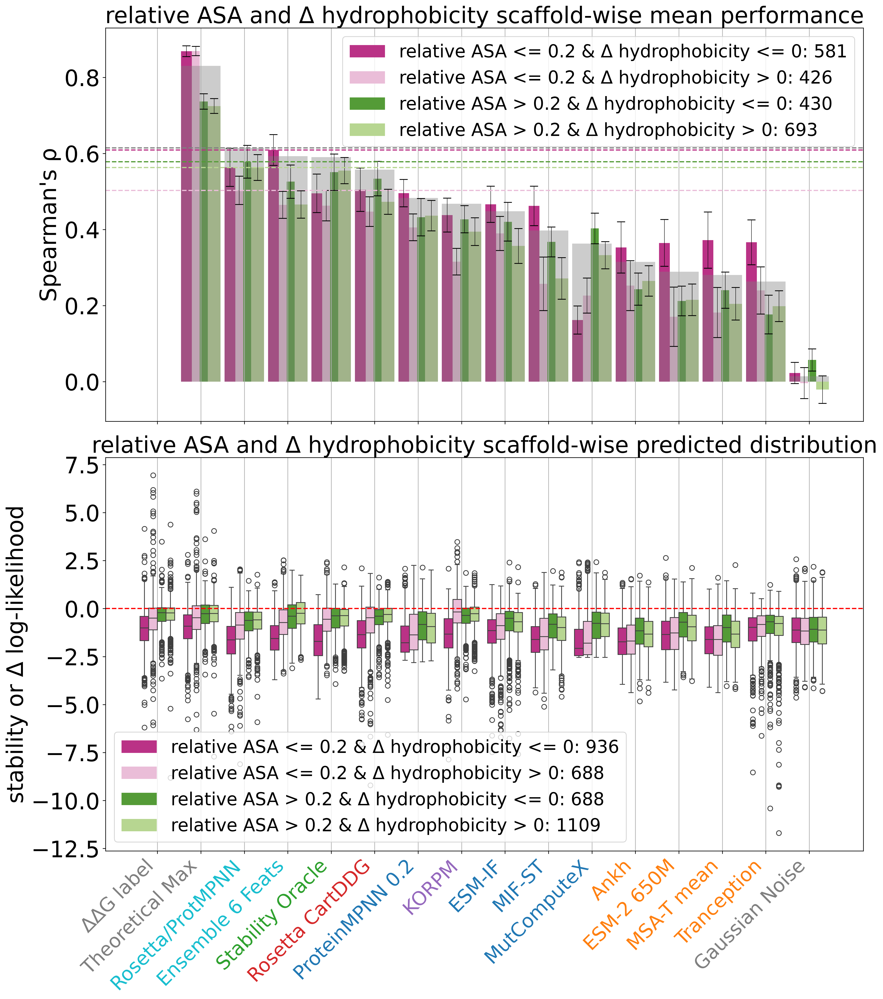

In [76]:
import importlib
importlib.reload(analysis_utils)

current_feats = ['delta_kdh_dir', 'rel_ASA_dir', 'ddG']
db_fig = db_complete[[c for c in db_complete if c in subset or c in current_feats or c == 'cluster']]
l1 = len(db_fig)
db_fig = db_fig.fillna(0)
#db_fig = db_fig.drop(['delta_kdh_dir', 'rel_ASA_dir'], axis=1)
db_fig = db_fig.rename({'delta_kdh_dir': 'delta_kdh', 'rel_ASA_dir': 'rel_ASA'}, axis=1)
d, models, fig = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'rel_ASA',
                        split_col_2 = 'delta_kdh', 
                        threshold_1 = 0.2, 
                        threshold_2 = 0, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps=1000,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster',
                        #order=model_order,
                        drop_label=False,
                        legend_loc='upper right',
                        saveloc_perf = os.path.join(path, 'data', 'extended', 'figure_data', 'ed_fig5c.csv'),
                        saveloc_dist = os.path.join(path, 'data', 'extended', 'figure_data', 'ed_fig5d.csv')
                        )

fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'ed_fig5cd.svg'), bbox_inches='tight')

### Generating the pairwise ensembles used in the model complementarity section

In [22]:
zs_feats = ['rel_ASA', 'delta_kdh', 'delta_vol', 'delta_chg']
models = original_pred_cols_reduced + [c + '_dir' for c in zs_feats]
#models += ['mpnn_mean_dir', 'esmif_mean_dir', 'esm2_mean_dir', 'mif_mean_dir']

#db_summ = db_preds.join(db_ddg).join(db_cluster)
#db_summ = db_class
#db_summ['ddG_dir'] = db_summ['ddG']
#db_summ['random_dir'] = np.random.normal(loc=0, size=len(db_summ))

dfm = db[models + ['cluster', 'ddG']] #db_summ.join(db_feats_2[zs_feats].drop_duplicates(), how='left')
#dfm['code'] = dfm.reset_index('uid2').index.str[:4]
ren = dict(zip(zs_feats, [f+'_dir' for f in zs_feats]))
dfm = dfm.rename(ren, axis=1)
dfr = db_runtimes.copy(deep=True).reset_index(level=0, drop=True)#.drop('uid', axis=1)
dfr['code'] = dfr.index.str[:4]
dfr[['runtime_' + r for r in ['rel_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir']]] = 0
dfr['runtime_mutcomputex_dir'] = np.nan
dfr['runtime_stability-oracle_dir'] = np.nan

weights = [1, 0.5, 0.2] #, -0.2] # could include -0.2 to allow for subtracting models
weights2 = [] # fill in weights to test 3-model ensembles
#weights2 = [0.8, 0.3]

all_cols = []

tmp_preds = []
tmp_runtimes = []
for model1 in models:
    for model2 in models:
        if model1 != model2:
            for weight in weights:
                tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight, name=f'{model1} + {model2} * {weight}'))
                #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model1].max() * weight, name=f'{model1} + {model2} * {weight}'))
                all_cols.append(f'{model1} + {model2} * {weight}')
                tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2], name=f'runtime_'+all_cols[-1]))
                for model3 in models:
                    if model3 != model2:
                    #if (model1.split('_')[0] != model3.split('_')[0]) and (model2.split('_')[0] != model3.split('_')[0]):
                        for weight2 in weights2:
                            tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight + dfm[model3]/dfm[model3].std() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model2].max() * weight + (dfm[model3]-dfm[model3].min())/dfm[model3].max() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            all_cols.append(f'{model1} + {model2} * {weight} + {model3} * {weight2}')
                            #tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2] + dfr['runtime_'+model3], name='runtime_'+all_cols[-1]))

print('concatenating')
dfm = pd.concat([dfm] + tmp_preds, axis=1)
dfr = pd.concat([dfr] + tmp_runtimes, axis=1)
print('joining...')
dfm = dfm.join(dfr.drop('code', axis=1))
dfm

# < 10 seconds

concatenating
joining...


,,esmif_monomer_dir,msa_transformer_median_dir,msa_transformer_mean_dir,mutcomputex_dir,esm2_3B_dir,esm2_15B_half_dir,esmif_multimer_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,...,runtime_delta_chg_dir + cartesian_ddg_dir * 0.2,runtime_delta_chg_dir + rel_ASA_dir * 1,runtime_delta_chg_dir + rel_ASA_dir * 0.5,runtime_delta_chg_dir + rel_ASA_dir * 0.2,runtime_delta_chg_dir + delta_kdh_dir * 1,runtime_delta_chg_dir + delta_kdh_dir * 0.5,runtime_delta_chg_dir + delta_kdh_dir * 0.2,runtime_delta_chg_dir + delta_vol_dir * 1,runtime_delta_chg_dir + delta_vol_dir * 0.5,runtime_delta_chg_dir + delta_vol_dir * 0.2
uid,uid2,,,,,,,,,,,,,,,,,,,,,
1A23_30S,1A23_30S,-0.043712,-8.570910,-8.462356,-0.010359,-11.571676,-11.668701,-0.043713,1.969108,2.077375,-1.336620,...,5,0,0,0,0,0,0,0,0,0
1A23_32L,1A23_32L,-0.042389,-7.639166,-7.748131,0.383801,-13.755667,-13.076172,-0.042389,-0.021528,2.326742,-0.249711,...,6,0,0,0,0,0,0,0,0,0
1A23_32S,1A23_32S,-0.029983,-5.161361,-5.346782,-0.003409,-8.291791,-10.436035,-0.029983,0.243430,0.858738,0.848582,...,6,0,0,0,0,0,0,0,0,0
1A23_32Y,1A23_32Y,-0.020219,-4.510036,-4.245017,0.060203,-8.121881,-9.415039,-0.020220,-0.115764,0.649091,0.128461,...,6,0,0,0,0,0,0,0,0,0
1A23_33S,1A23_33S,-0.024960,-7.309464,-7.304522,-0.327936,-12.002896,-12.722168,-0.024960,1.373216,-0.305126,0.340636,...,6,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,5CRO_26L,-0.037373,-0.298061,-0.834436,0.002285,-3.150103,-2.374512,-0.038054,0.082326,0.305977,0.155387,...,6,0,0,0,0,0,0,0,0,0
5CRO_26Q,5CRO_26Q,-0.004605,1.459888,0.721684,0.013478,-2.508844,-2.625244,-0.006247,1.808440,1.264375,1.854637,...,6,0,0,0,0,0,0,0,0,0
5CRO_26V,5CRO_26V,0.037691,0.751292,-0.029315,0.043387,-3.204980,-2.228027,0.032355,1.397881,0.928658,0.559066,...,6,0,0,0,0,0,0,0,0,0


In [23]:
series = dfm.reset_index()['uid'].duplicated(keep=False)
dfm.reset_index()['uid'][series]

Series([], Name: uid, dtype: object)

### Function to retrieve all the pairwise predictions (precalculated for this demo)

In [24]:
def get_summary_df(db_complete, cols=None, class_stats=(), saveloc='../data/pairwise/q3421_pairwise.csv', overwrite=False):

    if not overwrite:
        assert not os.path.exists(saveloc)
    if cols is None:
        cols = db_complete.columns

    df_summ = analysis_utils.compute_stats(db_complete[cols], stats=class_stats, measurements=['ddG'], grouper='cluster').reset_index().set_index(['measurement', 'model'])
    df_summ = df_summ.reset_index().rename({'index': 'model'}, axis=1)
    df_summ = df_summ.set_index(['measurement', 'model_type', 'model', 'class'])

    df_summ.to_csv(saveloc)
    return df_summ

### Pairwise statistics for all model combinations

In [43]:
# compute all statistics on the combined set (already done, takes ~12 hours)
d1 = get_summary_df(dfm, saveloc=os.path.join(path, 'data', 'pairwise', 'pairwise_q3421_combinations_3_weights.csv'), overwrite=True)
d1 = pd.read_csv(os.path.join(path, 'data', 'pairwise', 'pairwise_q3421_combinations_3_weights.csv')).set_index(['measurement', 'model_type', 'model', 'class'])
d1.xs('ddG').sort_values('aumsc', ascending=False).iloc[:20, 13:]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1976 [00:00<?, ?it/s]

auroc  \
model_type  model                                          class             
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.783691   
transfer    stability-oracle_dir + mpnn_20_00_dir * 0.5    NaN    0.799752   
biophysical mpnn_20_00_dir + cartesian_ddg_dir * 1         NaN    0.777436   
            cartesian_ddg_dir + mpnn_20_00_dir * 1         NaN    0.777436   
transfer    stability-oracle_dir + mpnn_10_00_dir * 0.5    NaN    0.798579   
            stability-oracle_dir + mpnn_30_00_dir * 0.5    NaN    0.796254   
            mpnn_20_00_dir + stability-oracle_dir * 1      NaN    0.790775   
            stability-oracle_dir + mpnn_20_00_dir * 1      NaN    0.790775   
biophysical stability-oracle_dir + cartesian_ddg_dir * 1   NaN    0.802370   
            cartesian_ddg_dir + stability-oracle_dir * 1   NaN    0.802370   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5       NaN    0.779256   
            cartesian_ddg_dir + esmif_multimer_dir * 0.5   NaN    0.767802   
            cartesian_ddg_dir + mpnn_10_00_dir * 1         NaN    0.776392   
            mpnn_10_00_dir + cartesian_ddg_dir * 1         NaN    0.776392   
transfer    mpnn_10_00_dir + stability-oracle_dir * 1      NaN    0.788405   
            stability-oracle_dir + mpnn_10_00_dir * 1      NaN    0.788405   
biophysical cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.795276   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.5       NaN    0.783507   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.2       NaN    0.777314   
transfer    esmif_multimer_dir + stability-oracle_dir * 1  NaN    0.777855   

                                                                     auprc  \
model_type  model                                          class             
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.530218   
transfer    stability-oracle_dir + mpnn_20_00_dir * 0.5    NaN    0.544865   
biophysical mpnn_20_00_dir + cartesian_ddg_dir * 1         NaN    0.525606   
            cartesian_ddg_dir + mpnn_20_00_dir * 1         NaN    0.525606   
transfer    stability-oracle_dir + mpnn_10_00_dir * 0.5    NaN    0.544298   
            stability-oracle_dir + mpnn_30_00_dir * 0.5    NaN    0.541884   
            mpnn_20_00_dir + stability-oracle_dir * 1      NaN    0.539166   
            stability-oracle_dir + mpnn_20_00_dir * 1      NaN    0.539166   
biophysical stability-oracle_dir + cartesian_ddg_dir * 1   NaN    0.540273   
            cartesian_ddg_dir + stability-oracle_dir * 1   NaN    0.540273   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5       NaN    0.523187   
            cartesian_ddg_dir + esmif_multimer_dir * 0.5   NaN    0.503470   
            cartesian_ddg_dir + mpnn_10_00_dir * 1         NaN    0.525923   
            mpnn_10_00_dir + cartesian_ddg_dir * 1         NaN    0.525923   
transfer    mpnn_10_00_dir + stability-oracle_dir * 1      NaN    0.536691   
            stability-oracle_dir + mpnn_10_00_dir * 1      NaN    0.536691   
biophysical cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.529170   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.5       NaN    0.532083   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.2       NaN    0.514754   
transfer    esmif_multimer_dir + stability-oracle_dir * 1  NaN    0.519476   

                                                                  0.0_n_stable  \
model_type  model                                          class                 
biophysical cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN           761.0   
transfer    stability-oracle_dir + mpnn_20_00_dir * 0.5    NaN           752.0   
biophysical mpnn_20_00_dir + cartesian_ddg_dir * 1         NaN           761.0   
            cartesian_ddg_dir + mpnn_20_00_dir * 1         NaN           761.0   
transfer    stability-oracle_dir + mpnn_10_00_dir * 0.5    NaN           752.0   
            stability-oracle_dir + mpnn_30_00_dir * 0.5    Na

### Supplementary Figure 7

3421


  0%|          | 0/100 [00:00<?, ?it/s]

0.08751867101698735
['Stability Oracle', 'Rosetta CartDDG', 'ProteinMPNN 0.2', 'KORPM', 'MIF', 'ESM-IF', 'MIF-ST', 'MutComputeX', 'Ankh', 'MSA-T mean', 'Tranception (reduced)', 'ESM-1V mean']


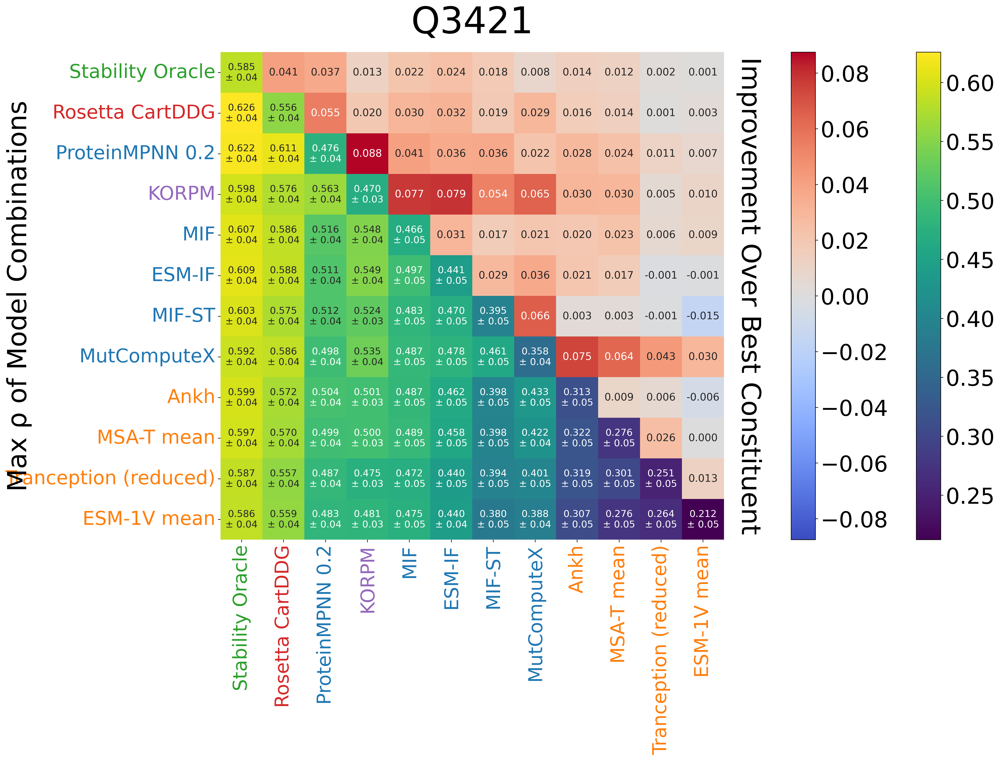

,model1,weight1,model2,weight2,mean_spearman,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,stability-oracle_dir,1,0.625743,0.0
2,stability-oracle_dir,1,cartesian_ddg_dir,0.5,0.622137,0.0
3,stability-oracle_dir,1,mpnn_20_00_dir,0.5,0.621577,0.0
4,cartesian_ddg_dir,1,stability-oracle_dir,0.5,0.61763,0.0
5,stability-oracle_dir,1,mpnn_20_00_dir,0.2,0.612849,0.0
...,...,...,...,...,...,...
326,esm1v_mean_dir,1,msa_transformer_mean_dir,0.5,0.254459,0.0
327,esm1v_mean_dir,1,tranception_dir,0.5,0.243458,0.025605
328,esm1v_mean_dir,1,ankh_dir,0.2,0.241746,0.0


In [70]:
subset2 = [
            'cartesian_ddg_dir',
            'esm1v_mean_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'ankh_dir',
            'esm2_dir',
            'esmif_multimer_dir',
            'mpnn_20_00_dir',
            'mif_dir',
            'mifst_dir',
            'korpm_dir',
            'mutcomputex_dir',
            'stability-oracle_dir'
        ]

measurement = 'ddG'
statistic = 'spearman'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df, fig = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], 
    statistic, measurement, n_bootstraps=100, upper=upper, subset=subset2, title='Q3421', saveloc_table=os.path.join(path, 'data', 'extended', 'figure_data', 'suppl_fig.csv'))
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
stat_df

### Extra Figure (not in text) showing Net Stabilization instead

3421


  0%|          | 0/100 [00:00<?, ?it/s]

174.0715
['Stability Oracle', 'ProteinMPNN 0.2', 'ESM-IF', 'Rosetta CartDDG', 'Tranception (reduced)', 'Ankh', 'MIF-ST', 'MIF', 'MutComputeX', 'MSA-T mean', 'ESM-1V mean', 'KORPM']


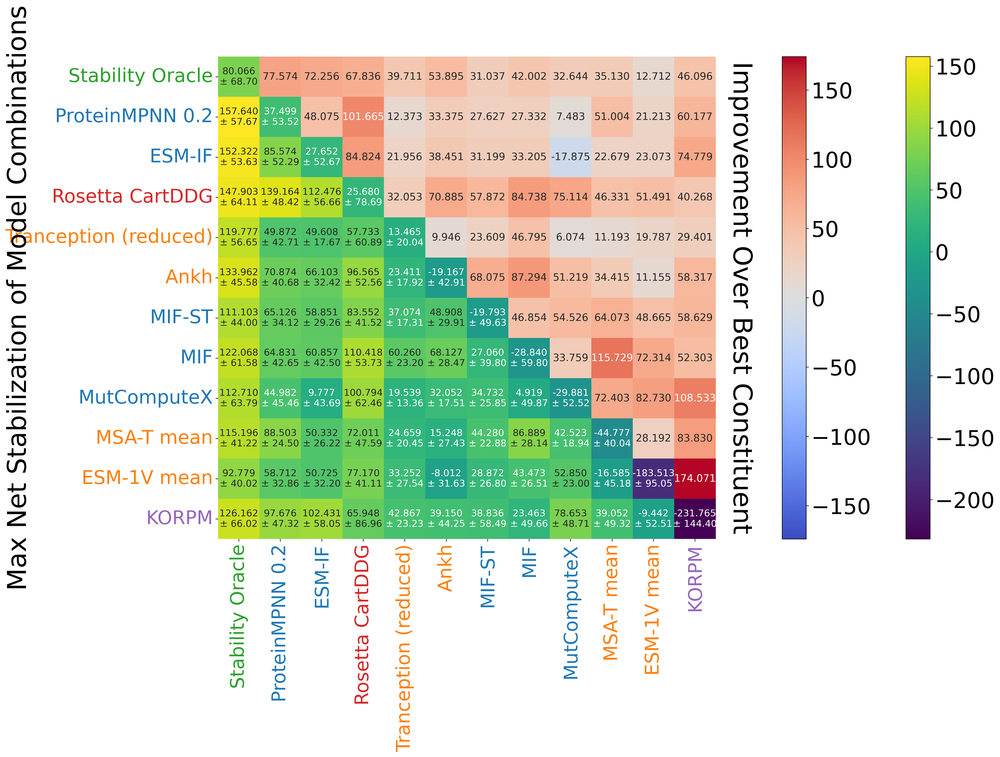

,model1,weight1,model2,weight2,mean_net_stabilization,p_value
rank,,,,,,
1,stability-oracle_dir,1,mpnn_20_00_dir,0.2,157.6399,0.0
2,stability-oracle_dir,1,mpnn_20_00_dir,0.5,153.4329,0.0
3,stability-oracle_dir,1,esmif_multimer_dir,0.5,152.3219,0.0
4,cartesian_ddg_dir,1,stability-oracle_dir,1,147.9027,0.0
5,stability-oracle_dir,1,cartesian_ddg_dir,0.5,147.8519,0.0
...,...,...,...,...,...,...
326,korpm_dir,1,stability-oracle_dir,0.2,-91.7681,0.0
327,esm1v_mean_dir,1,tranception_dir,0.2,-95.5307,0.0
328,korpm_dir,1,cartesian_ddg_dir,0.2,-100.7412,0.0


In [71]:
measurement = 'ddG'
statistic = 'net_stabilization'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df, fig = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], statistic, measurement, n_bootstraps=100, upper=upper, subset=subset2)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
#stat_df.loc[stat_df['runtime_gpu']<0, 'runtime_gpu'] = np.nan
stat_df

# ~ 10 seconds

### Supplementary Figure 3

[ 5.59485531e-01  5.00000000e-01  4.67018470e-01  0.00000000e+00
 -9.03538256e-06  0.00000000e+00 -5.43614752e-04]


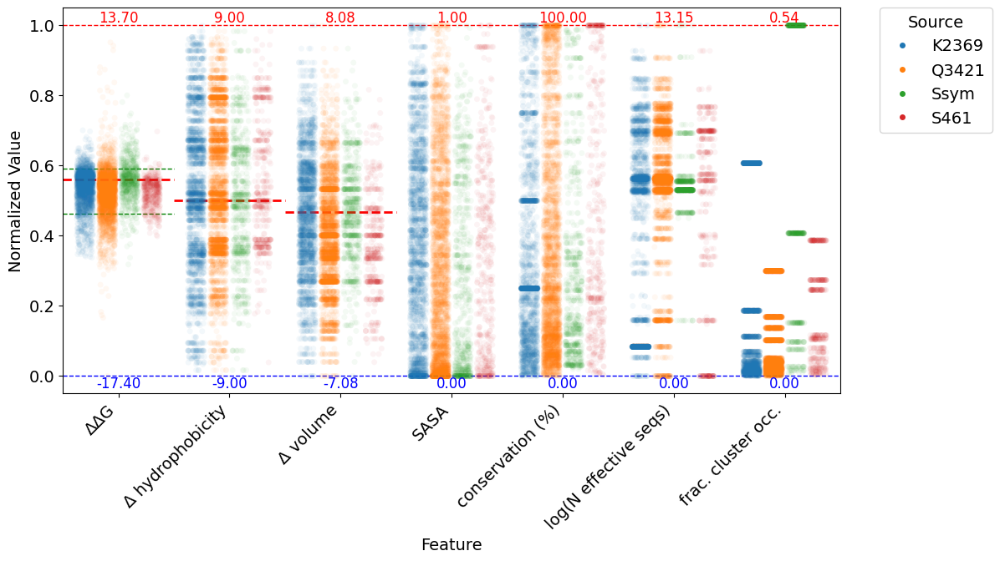

In [72]:
#db = pd.read_csv(os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv'))
s461_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))
ssym_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv'))
ssym_feats = ssym_feats.rename({'delta_kdh':'delta_kdh_dir', 'delta_vol':'delta_vol_dir', 'rel_ASA':'rel_ASA_dir'}, axis=1)
korpm_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 'k2369_analysis.csv'))

#compare_distributions_violin(db_feats_2.drop(['n_seqs', 'on_interface', 'column_completeness', 'saltbrs'], axis=1).join(db_ddg), s461_feats, shared_columns=['delta_kdh', 'delta_vol', 'rel_ASA', 'conservation', 'ddG'])
fig = analysis_utils.compare_distributions_boxes([korpm_feats,db,ssym_feats,s461_feats], shared_columns=['ddG', 'delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'conservation', 'log_neff'], sources=['K2369', 'Q3421', 'Ssym', 'S461'])
#analysis_utils.compare_distributions_violin(db, korpm_feats, shared_columns=['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'conservation', 'log_neff', 'ddG'], source1='Q3421', label_adjust=0.25)
fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'supp_fig3.png'), bbox_inches='tight')

In [73]:
### Supplementary Figure 4

0.0013924680652412


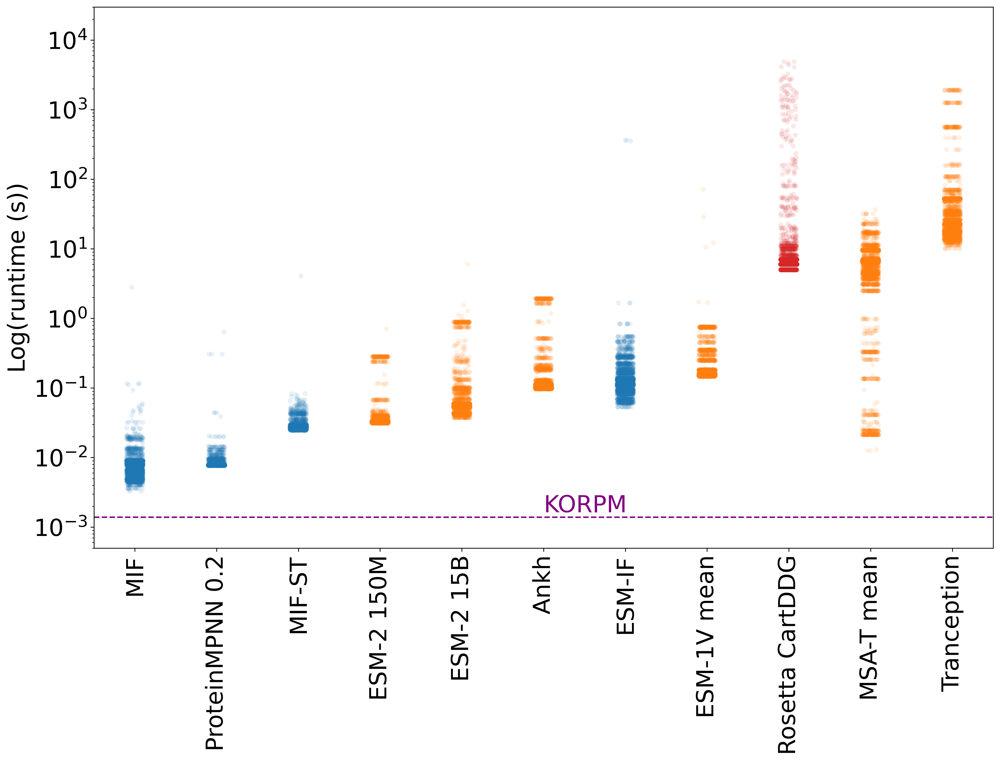

In [74]:
int_runtimes = db_runtimes.dropna(axis=1, how='all')#.groupby('code').mean()#.sum() #uncomment to get mean per protein
int_runtimes = int_runtimes[[
                             'runtime_esmif_multimer_dir',
                             'runtime_mif_dir',
                             'runtime_mifst_dir',
                             'runtime_mpnn_20_00_dir',
                             'runtime_tranception_weights_dir',
                             'runtime_msa_transformer_mean_dir',
                             'runtime_esm1v_mean_dir',
                             'runtime_esm2_150M_dir',
                             'runtime_cartesian_ddg_dir',
                             'runtime_ankh_dir',
                             'runtime_esm2_15B_half_dir',
                             'runtime_korpm_dir'
                            ]]

int_runtimes.columns = [c[8:-4] for c in int_runtimes.columns]
#int_runtimes.columns = int_runtimes.columns.map(analysis_utils.remap_names)
total_runtimes = int_runtimes.melt().sort_values('value')#.sum(axis=0)

### determine order for displaying runtimes
# Calculate the grouped median
grouped_median = total_runtimes.groupby('variable')['value'].median()
# Create a temporary column 'group_median' with the grouped medians mapped to each row
total_runtimes['group_median'] = total_runtimes['variable'].map(grouped_median)
# Sort the DataFrame first by 'group_median' and then by 'variable'
df_sorted = total_runtimes.sort_values(['group_median', 'variable'], ascending=True)
# Drop the temporary column 'group_median'
total_runtimes = df_sorted.drop(columns=['group_median'])
korpm_time = total_runtimes.loc[total_runtimes['variable']=='korpm', 'value'].mean()
print(korpm_time)
total_runtimes = total_runtimes.loc[total_runtimes['variable']!='korpm']

total_runtimes['category'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_category(x))
total_runtimes['color'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_base_color(x))

custom_palette = [
    (0.12156863, 0.46666667, 0.70588235),  # blue
    (1.0, 0.49803922, 0.05490196),  # orange
    (0.8392156862745098, 0.153, 0.153)  # red
]

# Set the custom palette
sns.set_palette(custom_palette)

fig, ax = plt.subplots(figsize=(1.5*total_runtimes['variable'].nunique(), 10), dpi=300)  # adjust the size here
ax = sns.stripplot(data=total_runtimes, x='variable', y='value', hue='color', alpha=0.1, legend=False)

plt.axhline(y=korpm_time, color='purple', linestyle='--', label='KORPM')
plt.text(5, korpm_time, 'KORPM', color='purple', verticalalignment='bottom', fontsize=24)

remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
ax.set_xticklabels(remapped_x)
ax.set_yticklabels(remapped_x[::-1])
#plt.title('Per-Mutation Runtimes on Q3421', fontsize=36)
plt.yscale('log')
plt.ylim(0.0005, 30000)
plt.xticks(rotation=90, fontsize=24)
plt.xlabel('')
plt.yticks(fontsize=24)
plt.ylabel('Log(runtime (s))', fontsize=24)
plt.show()

fig.savefig(os.path.join(path, 'data', 'extended', 'figure_data', 'supp_fig4.png'), bbox_inches='tight')

### Figure 5 (Methods)

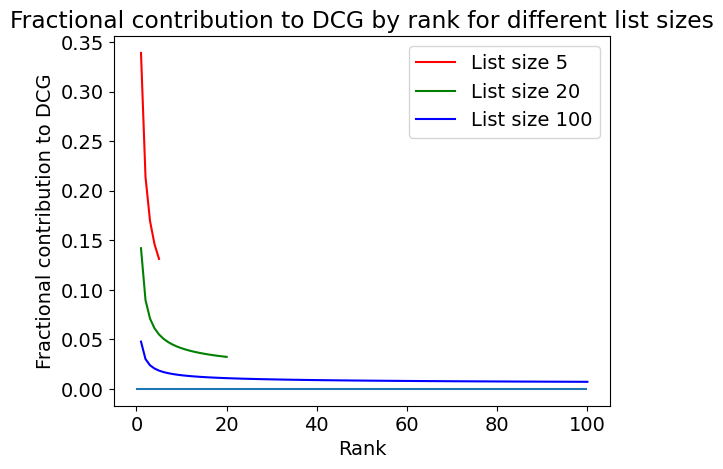

In [75]:
import matplotlib.pyplot as plt
import numpy as np

def fractional_contributions(list_size, base=2):
    ranks = np.arange(1, list_size+1)
    discounts = 1 / np.log2(ranks + 1)  # compute the discount for each rank
    return discounts / np.sum(discounts)  # normalize to get fractional contributions

list_sizes = [5, 20, 100]
colors = ['r', 'g', 'b']

for i, list_size in enumerate(list_sizes):
    fractions = fractional_contributions(list_size)
    plt.plot(np.arange(1, list_size+1), fractions, color=colors[i], label=f'List size {list_size}')

plt.xlabel('Rank')
plt.ylabel('Fractional contribution to DCG')
plt.title('Fractional contribution to DCG by rank for different list sizes')
plt.hlines(0, 0, 100)
plt.legend()
plt.show()